In [3]:
import sys 
sys.path.append('../../github_repos/noise2self-master/')
sys.path.append('../../utils')

from segy_input import load_seisnc
from utils_birnie_2021 import fspectra

/home/hwjayb/.local/lib/python3.9/site-packages/segysak/segy/_segy_core.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import disk
from skimage.filters import gaussian, median
from skimage import data, img_as_float, img_as_ubyte
from skimage.color import gray2rgb
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

In [5]:
plt.rc('figure', figsize = (5,5))

In [6]:
# siesmic image 
CLEAN_SEISNC_PATH = '/local1/workspace/random_denoising/data/mp41b_pstm_stk_rnd/MP41B_PSTM_STK_RND.seisnc'
seisnc = load_seisnc(CLEAN_SEISNC_PATH)
ilines = seisnc['iline'].values

In [7]:
iline_no = 1155
noise_factor = 0.5
noise_mode = 'gaussian'

In [8]:
def preprocess(iline) : 

    abs_max = abs(iline).quantile(0.99) # take the 99th percentile abs value

    iline = iline.clip(-abs_max, abs_max) # clip

    iline_norm = iline / abs_max

    return iline_norm

def add_noise(data, mode, mean,noise_factor) : 

    args = dict(mode = mode, seed=42, clip=True, mean =mean , var = noise_factor)
    return random_noise(data, **args)



iline = seisnc.sel(iline=iline_no).transpose('twt','xline')

iline_norm = iline.map(preprocess)

mean_ = 0 

iline_norm_noisy = iline_norm.map(add_noise, args=(noise_mode,mean_, noise_factor) )


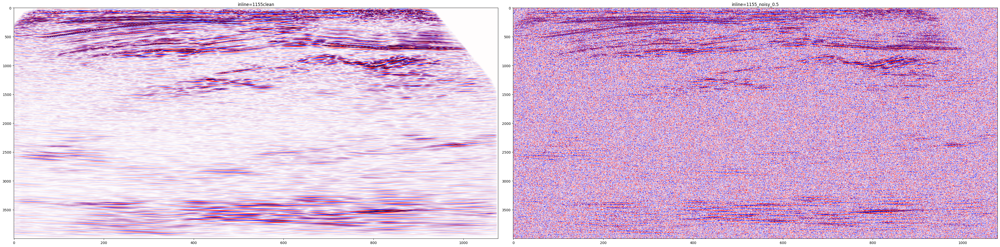

In [9]:
# plot clean, noisy comparison of image and spectra

fig, ax = plt.subplots(ncols=2, figsize =(40,10))

ax[0].set_title('inline=' + str(iline_no) + 'clean')
ax[0].imshow(iline_norm.data, cmap='seismic', aspect='auto', vmin=-1, vmax = 1)

ax[1].set_title('inline=' + str(iline_no) + '_noisy_' + str(noise_factor))
ax[1].imshow(iline_norm_noisy.data, cmap='seismic', aspect='auto', vmin=-1, vmax =1)
plt.tight_layout()
plt.show()


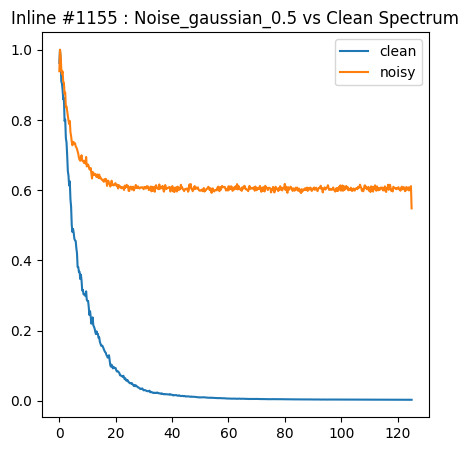

In [10]:
# Frequency spectra

f_clean, a_clean = fspectra(iline_norm.data, dt=4)
f_noisy, a_noisy = fspectra(iline_norm_noisy.data, dt=4)

plt.figure()
plt.title('Inline #' + str(iline_no) + ' : Noise' + '_'+ str(noise_mode) + '_' + str(noise_factor) + ' vs Clean Spectrum')
plt.plot(f_clean,a_clean/max(a_clean), label = 'clean')
plt.plot(f_noisy , a_noisy/ max(a_noisy), label = 'noisy')
plt.legend()
plt.show()

In [11]:
len(iline_norm['xline'].values)

1078

In [12]:
len(iline_norm['twt'].values)

4000

In [13]:
# taking one 512x512 patch
patch_size = 512
twt_start_index = 500
xline_start_index = 1078 - 512 - 200

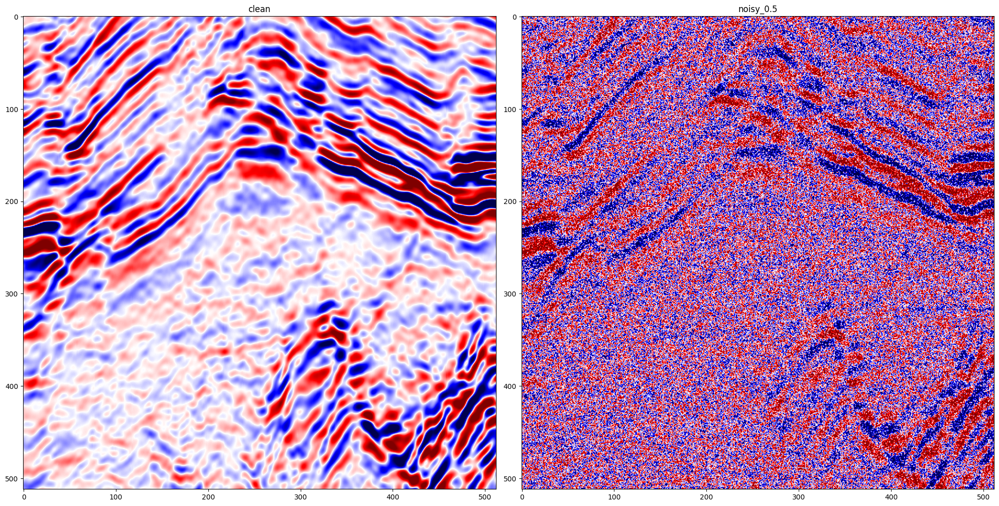

In [14]:
clean_patch = iline_norm.isel(twt=slice(twt_start_index , twt_start_index + patch_size), xline = slice(xline_start_index, xline_start_index + patch_size))
noisy_patch = iline_norm_noisy.isel(twt=slice(twt_start_index , twt_start_index + patch_size), xline = slice(xline_start_index, xline_start_index + patch_size))

fig, ax = plt.subplots(ncols=2, figsize =(20,10))

ax[0].set_title('clean')
ax[0].imshow(clean_patch.data, cmap='seismic',  vmin=-1, vmax = 1)

ax[1].set_title('noisy_' + str(noise_factor))
ax[1].imshow(noisy_patch.data, cmap='seismic', vmin=-1, vmax = 1)
plt.tight_layout()
plt.show()

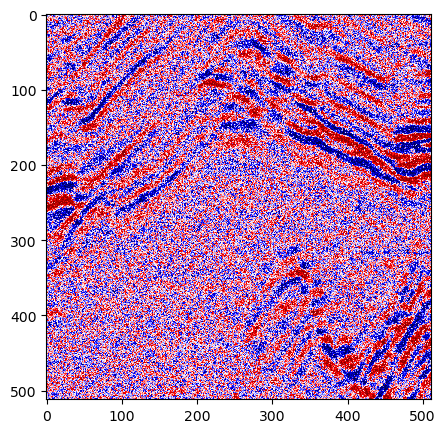

In [ ]:
# patch image 
noisy_image = img_as_float(noisy_patch.compute().data)
plt.imshow(noisy_image, cmap='seismic')

In [ ]:
import torch

noisy = noisy_image
# display(np.min(noisy), np.max(noisy))
# orig_min = np.min(noisy)
# orig_range = np.ptp(noisy)

# rescaling from 0 to 1 
# noisy = (noisy-np.min(noisy))/np.ptp(noisy)

# display(np.min(noisy), np.max(noisy))
noisy = torch.Tensor(noisy_image[np.newaxis, np.newaxis])

In [ ]:
# # rescaling clean patch too 
# clean_patch_r = clean_patch.to_array().compute().data
# clean_patch_rescaled = (clean_patch_r-np.min(clean_patch_r))/np.ptp(clean_patch_r)
# clean_patch_rescaled = clean_patch_rescaled[0]
# display(clean_patch_rescaled.shape)

# np.min(clean_patch_rescaled), np.max(clean_patch_rescaled)

In [ ]:
device='cuda:0'

In [ ]:
# Masking 
from mask import Masker
masker = Masker(width = 4, mode='interpolate')

In [ ]:
### Model 
torch.manual_seed(3)
sys.path.append('../github_repos/noise2self-master/models/')

from dncnn import DnCNN
model = DnCNN(1, num_of_layers = 8)

In [ ]:
max_epochs = 500 


In [ ]:
model

DnCNN(
  (dncnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU(inplace=True)
    (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): Conv2d(64, 64, kernel_size

In [ ]:
### Training 
from torch.nn import MSELoss, L1Loss
from torch.optim import Adam

loss_function = MSELoss()
optimizer = Adam(model.parameters(), lr=0.01)

model = model.to(device)
noisy = noisy.to(device)

losses = []
val_losses = []
best_images = []
best_val_loss = 1


for i in range(500):
    model.train()
    
    net_input, mask = masker.mask(noisy, i % (masker.n_masks - 1))
    net_output = model(net_input)
    
    loss = loss_function(net_output*mask, noisy*mask)
    optimizer.zero_grad()
 
    loss.backward()
    
    optimizer.step()
    
    if i % 10 == 0:
        losses.append(loss.item())
        model.eval()
        
        net_input, mask = masker.mask(noisy, masker.n_masks - 1)
        net_output = model(net_input)
    
        val_loss = loss_function(net_output*mask, noisy*mask)
        
        val_losses.append(val_loss.item())
        
        print("(", i, ") Loss: \t", round(loss.item(), 5), "\tVal Loss: \t", round(val_loss.item(), 5))

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            denoised = np.clip(model(noisy).detach().cpu().numpy()[0, 0], -1, 1).astype(np.float64)
            best_psnr = compare_psnr(denoised, clean_patch.data)
            best_images.append(denoised)
            print("\tModel PSNR: ", np.round(best_psnr, 2))

( 0 ) Loss: 	 0.03109 	Val Loss: 	 0.10522
	Model PSNR:  1.38
( 10 ) Loss: 	 0.02599 	Val Loss: 	 0.0987
	Model PSNR:  10.46
( 20 ) Loss: 	 0.0251 	Val Loss: 	 0.125
( 30 ) Loss: 	 0.02274 	Val Loss: 	 0.02728
	Model PSNR:  17.16
( 40 ) Loss: 	 0.02247 	Val Loss: 	 0.02486
	Model PSNR:  19.68
( 50 ) Loss: 	 0.02239 	Val Loss: 	 0.0227
	Model PSNR:  22.35
( 60 ) Loss: 	 0.0219 	Val Loss: 	 0.02224
	Model PSNR:  23.04
( 70 ) Loss: 	 0.022 	Val Loss: 	 0.02219
	Model PSNR:  23.43
( 80 ) Loss: 	 0.02225 	Val Loss: 	 0.02219
	Model PSNR:  23.66
( 90 ) Loss: 	 0.02183 	Val Loss: 	 0.02212
	Model PSNR:  23.47
( 100 ) Loss: 	 0.02195 	Val Loss: 	 0.02211
	Model PSNR:  23.67
( 110 ) Loss: 	 0.02221 	Val Loss: 	 0.0221
	Model PSNR:  23.6
( 120 ) Loss: 	 0.02181 	Val Loss: 	 0.02208
	Model PSNR:  23.43
( 130 ) Loss: 	 0.02193 	Val Loss: 	 0.02206
	Model PSNR:  23.52
( 140 ) Loss: 	 0.0222 	Val Loss: 	 0.02207
( 150 ) Loss: 	 0.0218 	Val Loss: 	 0.02204
	Model PSNR:  23.47
( 160 ) Loss: 	 0.02192 

psnr 23.41037522296584


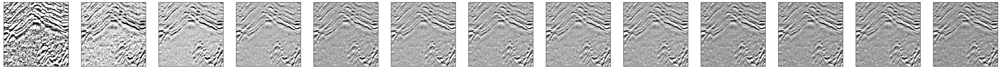

In [ ]:
plot_images(best_images[::2])
denoised = best_images[-1]
print('psnr', compare_psnr(denoised, clean_patch.compute().data))

In [ ]:
np.min(denoised), np.max(denoised)

(-0.8693806529045105, 0.7956721186637878)

In [ ]:
# filtering the signal to remove low frequencies

from skimage.filters import butterworth 

# denoised = orig_range * denoised + orig_min

# display(np.min(denoised), np.max(denoised))
denoised_filtered = butterworth(denoised, 0.01,high_pass = True, order=8)



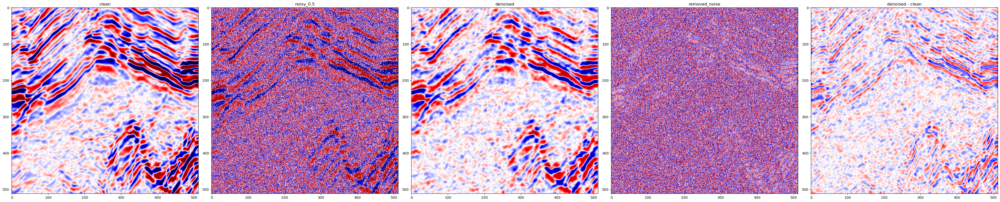

In [ ]:
fig, ax = plt.subplots(ncols=5, figsize =(40,10))

ax[0].set_title('clean')
ax[0].imshow(clean_patch.data, cmap='seismic',  vmin=-1, vmax = 1)

ax[1].set_title('noisy_' + str(noise_factor))
ax[1].imshow(noisy_patch.data, cmap='seismic', vmin=-1, vmax = 1)


ax[2].set_title('denoised')
ax[2].imshow(denoised, cmap='seismic', vmin=-1, vmax = 1)

ax[3].set_title('removed_noise')
ax[3].imshow(noisy_patch.data - denoised, cmap='seismic', vmin=-1, vmax = 1)

ax[4].set_title('denoised - clean')
ax[4].imshow(denoised - clean_patch.data, cmap='seismic', vmin=-1, vmax = 1)

# ax[5].set_title('denoised_filtered')
# ax[5].imshow(denoised_filtered, cmap='seismic', vmin=-1, vmax = 1)

plt.tight_layout()
plt.show()

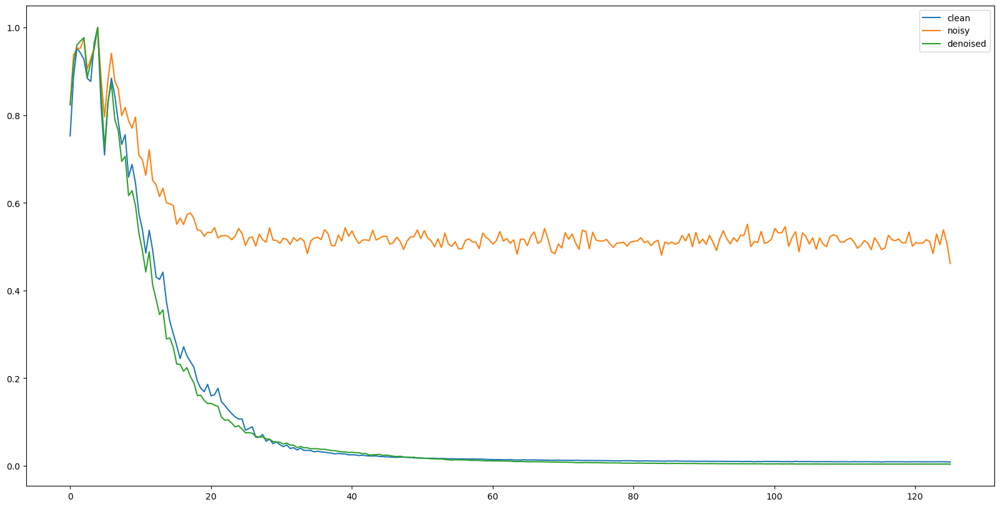

In [ ]:
# Frequency spectra comparison

f_clean, a_clean = fspectra(clean_patch.data, dt=4)
f_noisy, a_noisy = fspectra(noisy_patch.data, dt=4)
f_denoised, a_denoised = fspectra(denoised, dt=4)

f_denoised_f, a_denoised_f = fspectra(denoised_filtered, dt=4)
plt.figure(figsize=(20,10))

plt.plot(f_clean,a_clean/max(a_clean), label = 'clean')
plt.plot(f_noisy , a_noisy/ max(a_noisy), label = 'noisy')
plt.plot(f_denoised, a_denoised/ max(a_denoised), label = 'denoised')
# plt.plot(f_denoised_f, a_denoised_f/ max(a_denoised_f), label = 'denoised_filtered')
plt.legend()
plt.show()

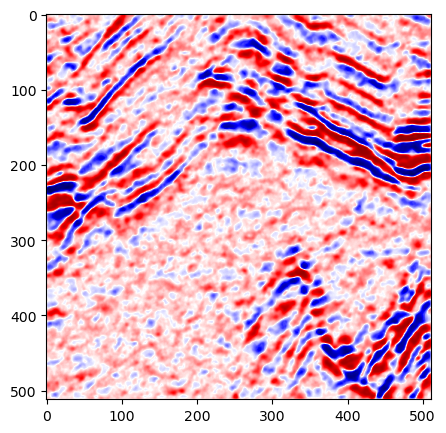

In [ ]:
plt.imshow(denoised_filtered, cmap='seismic')